# Import required libraries

In [167]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation
from sklearn.linear_model import Perceptron
from matplotlib.animation import FuncAnimation
from sklearn.datasets import make_classification
from mlxtend.plotting import plot_decision_regions

# Load dataset

In [168]:
df = pd.read_csv('/content/placement.csv')
print("Print the Head","\n")
print(df.head()) # show first 5 rows
print("\n","Print the shape","\n")
print(df.shape) # dataset dimensions

Print the Head 

   cgpa  resume_score  placed
0  8.14          6.52       1
1  6.17          5.17       0
2  8.27          8.86       1
3  6.88          7.27       1
4  7.52          7.30       1

 Print the shape 

(100, 3)


<Axes: xlabel='cgpa', ylabel='resume_score'>

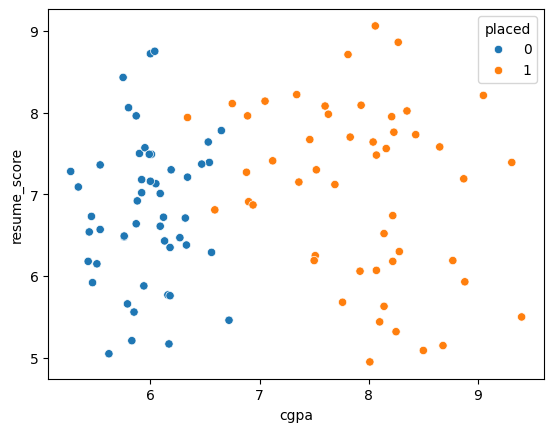

In [169]:
sns.scatterplot(x=df['cgpa'],y=df['resume_score'],hue=df['placed'])

# Separate features (X) and labels (y)

In [170]:
X = df.iloc[:,0:2]
y = df.iloc[:,-1]

# Create sklearn perceptron

In [171]:
p = Perceptron()

In [172]:
p.fit(X,y)

Perceptron()

# Model coefficients and intercept (before training)

In [173]:
print("Cofecient: ",p.coef_)
print("Intercept: ",p.intercept_)

Cofecient:  [[ 40.26 -36.  ]]
Intercept:  [-25.]


# Visualize decision boundary (without training yet)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but Perceptron was fitted with feature names
  warnings.warn(


<Axes: >

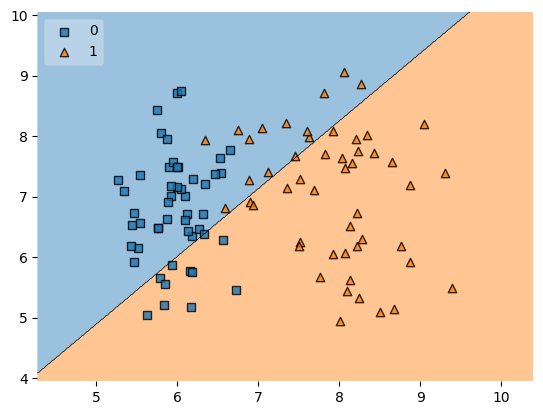

In [174]:
plot_decision_regions(X.values,y.values,clf=p,legend=2)

## Perceptron Trick


In [175]:
X , y = make_classification(n_samples=100,n_features=2,n_informative=1,n_redundant=0,
                            n_classes=2,n_clusters_per_class=1,random_state=41,hypercube=False,class_sep=10)

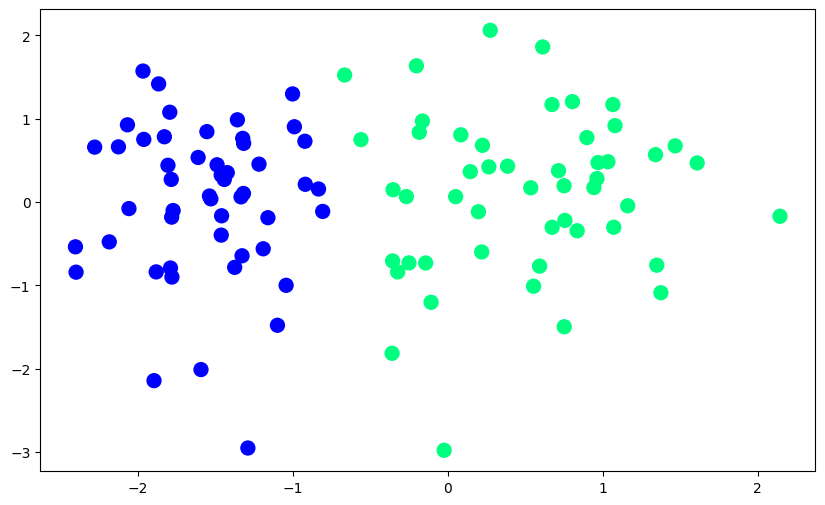

In [176]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

# -------------------------------
# Perceptron Implementation (Version 1)
# -------------------------------

In [177]:
def perceptron(X,y):
# Add bias term (column of ones at index 0)
  X = np.insert(X,0,1,axis=1)
   # Initialize weights with ones
  weights = np.ones(X.shape[1])
  # Learning rate
  lr = 0.1
 # Train for 1000 iterations
  for i in range(1000):
    # Pick a random sample
    j = np.random.randint(0,100)
     # Prediction using step function
    y_hat = step(np.dot(X[j],weights))
    # Weight update rule
    weights = weights + lr*(y[j]-y_hat)*X[j]
 # Return intercept and coefficients separately
  return weights[0],weights[1:]

# Step activation function

In [178]:
def step(z):
  return 1 if z > 0 else 0

# Train perceptron on dataset

In [179]:
intercept_,coef_ = perceptron(X,y)
print("Print coeficient: ",coef_)
print("Print Intercept: ",intercept_)

Print coeficient:  [1.32268526 0.16105871]
Print Intercept:  0.9


# Equation of decision boundary: y = mx + b

In [180]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

# Plot decision boundary

In [181]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

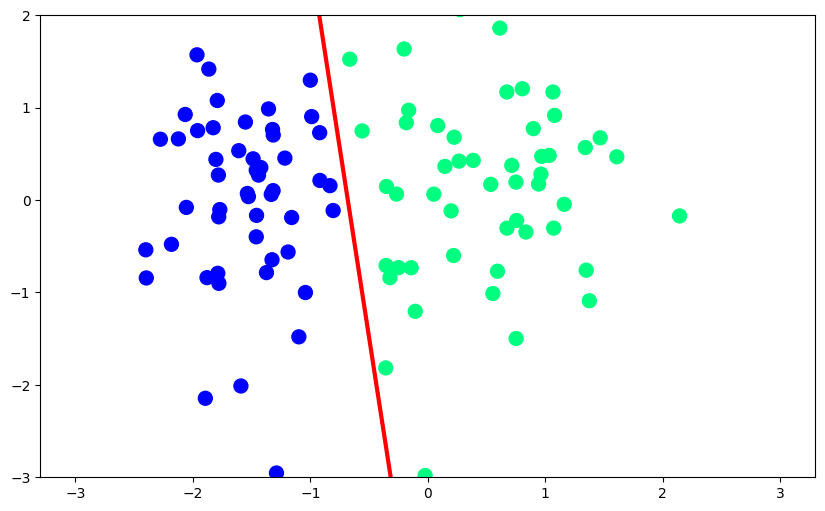

In [182]:
plt.figure(figsize = (10,6))
plt.plot(x_input,y_input,color = 'red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

# -------------------------------
# Perceptron with Tracking (for animation)
# -------------------------------

In [183]:
def perceptron(X,y):

  m = [] # store slope after each epoch
  b = [] # store intercept after each epoch

  X = np.insert(X,0,1,axis=1)
  weights = np.ones(X.shape[1])
  lr = 0.1

  for i in range(200):
    j = np.random.randint(0,100)
    y_hat = step(np.dot(X[j],weights))
    weights = weights + lr*(y[j]-y_hat)*X[j]
     # Store slope and intercept for animation
    m.append(-(weights[1]/weights[2]))
    b.append(-(weights[0]/weights[2]))

  return m,b

# Get slope and intercept values across epochs

In [184]:
m,b = perceptron(X,y)

# Create plot

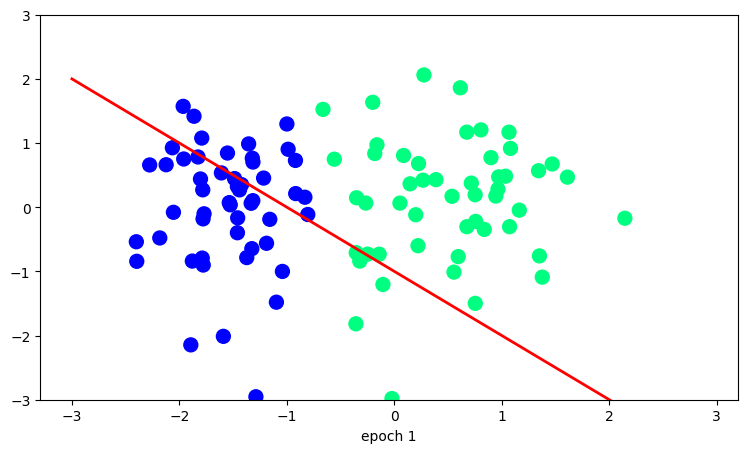

In [185]:
fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3,3,0.1)
y_i = x_i * m[0] + b[0]
# Scatter plot of data points
ax.scatter(X[:,0],X[:,1],c=y,cmap = 'winter',s = 100)
# Initialize decision boundary line
line, = ax.plot(x_i,x_i*m[0]+b[0],'r-',linewidth=2)
plt.ylim(-3,3)
# Update function for animation
def update(i):
  label = 'epoch {0}'.format(i+1)
  line.set_ydata(x_i*m[i]+b[i])  # update decision boundary
  ax.set_xlabel(label) # show epoch number

# Animate the training process
anim = FuncAnimation(fig,update,repeat=True, frames=200,interval=100)

In [186]:
anim

In [187]:
anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())

# -------------------------------
# Perceptron Implementation (Version 2 - Explicit Updates)
# -------------------------------

In [188]:
def perceptron(X,y):
  # Initialize weights and bias
  w1 = w2 = b = 1
  lr = 0.1
  # Loop through dataset multiple times (epochs)
  for j in range(1000):
    for i in range(X.shape[0]):
      # Linear combination
      z = w1*X[i][0] + w2*X[i][1] + b
      # Update only if prediction is wrong (misclassified point)
      if z*y [i]<0:
        w1 = w1 + lr*y[i]*X[i][0]
        w2 = w2 + lr*y[i]*X[i][1]
        b = b + lr*y[i]
  return w1,w2,b

# Train model

In [189]:
w1,w2,b = perceptron(X,y)


# Slope and intercept of decision boundary

In [190]:
m = -(w1/w2)
c = -(b/w2)

print(m,c)

-6.108023124170937 -9.250656660875727


# Plot decision boundary

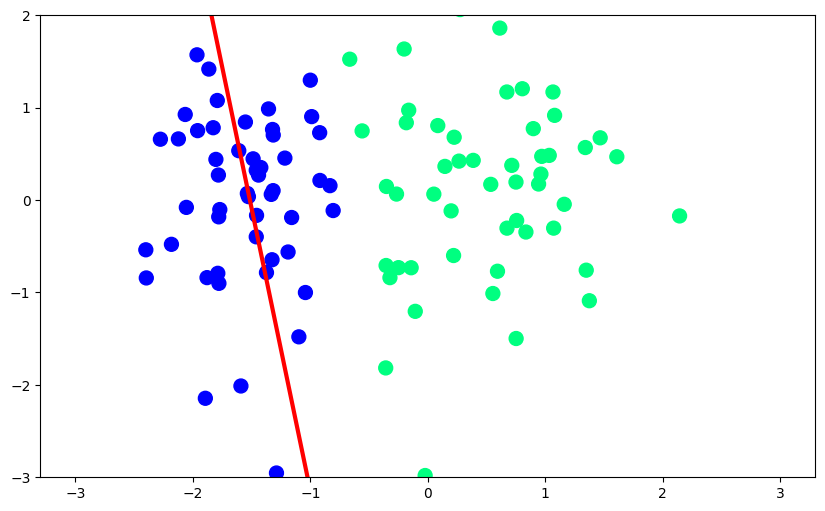

In [191]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + c

plt.figure(figsize = (10,6))
plt.plot(x_input,y_input,color = 'red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
plt.show()


# -------------------------------
# Logic Gates with Perceptron
# -------------------------------

## Problem In Perceptron

In [192]:
or_data = pd.DataFrame()
and_data = pd.DataFrame()
xor_data = pd.DataFrame()

# Create truth tables for OR, AND, XOR

In [193]:
or_data['input1'] = [1,1,0,0]
or_data['input2'] = [1,0,1,0]
or_data['output'] = [1,1,1,0]

In [194]:
and_data['input1'] = [1,1,0,0]
and_data['input2'] = [1,0,1,0]
and_data['output'] = [1,0,0,0]

In [195]:
xor_data['input1'] = [1,1,0,0]
xor_data['input2'] = [1,0,1,0]
xor_data['output'] = [0,1,1,0]

In [196]:
and_data

,input1,input2,output
0,1,1,1
1,1,0,0
2,0,1,0
3,0,0,0


# Visualize datasets

In [197]:
%matplotlib inline

<Axes: xlabel='input1', ylabel='input2'>

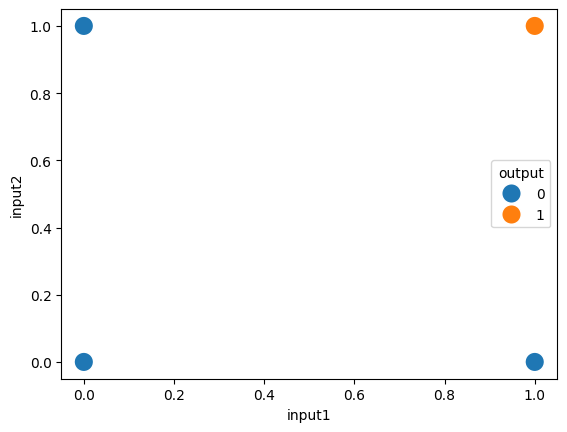

In [198]:
sns.scatterplot(x='input1', y='input2', hue='output', data=and_data, s=200)

In [199]:
or_data

,input1,input2,output
0,1,1,1
1,1,0,1
2,0,1,1
3,0,0,0


<Axes: xlabel='input1', ylabel='input2'>

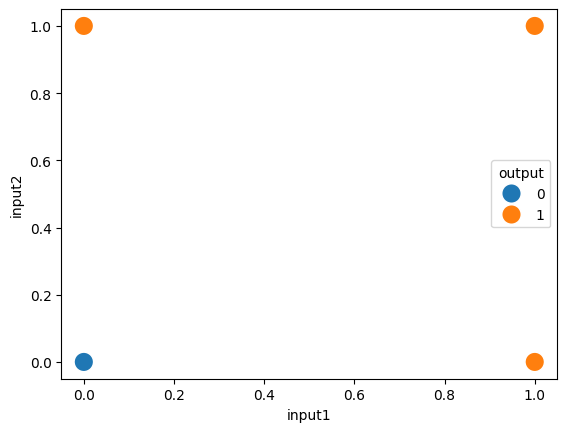

In [200]:
sns.scatterplot(x='input1', y='input2', hue='output', data=or_data, s=200)

In [201]:
xor_data

,input1,input2,output
0,1,1,0
1,1,0,1
2,0,1,1
3,0,0,0


<Axes: xlabel='input1', ylabel='input2'>

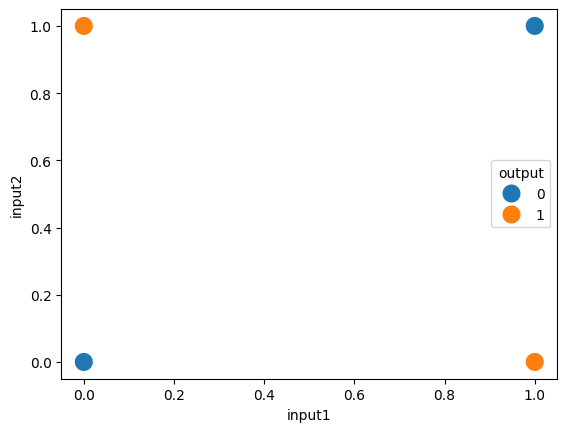

In [202]:
sns.scatterplot(x='input1', y='input2', hue='output', data=xor_data, s=200)

# -------------------------------
# Fitting sklearn Perceptron on Logic Gates
# -------------------------------

In [203]:
from sklearn.linear_model import Perceptron

clf1 = Perceptron()
clf2 = Perceptron()
clf3 = Perceptron()


# Train models

In [204]:
clf1.fit(and_data.iloc[:,0:2].values,and_data.iloc[:,-1].values)
clf2.fit(or_data.iloc[:,0:2].values,or_data.iloc[:,-1].values)
clf3.fit(xor_data.iloc[:,0:2].values,xor_data.iloc[:,-1].values)

Perceptron()

# Check learned weights and Plot decision regions

In [205]:
clf1.coef_

array([[2., 2.]])

In [206]:
clf1.intercept_

array([-2.])

In [207]:
x = np.linspace(-1,2,100)
y = - x + 1

<Axes: xlabel='input1', ylabel='input2'>

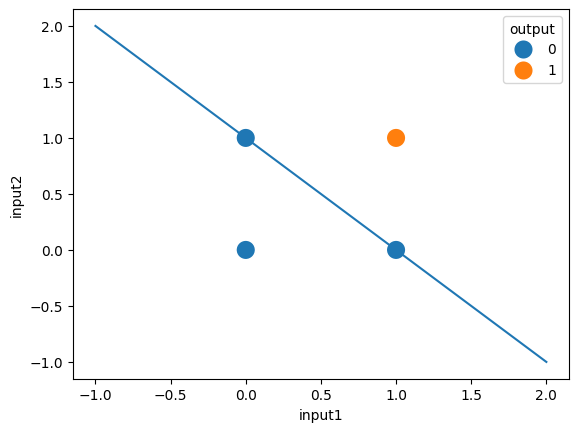

In [208]:
plt.plot(x,y)
sns.scatterplot(x='input1', y='input2', hue='output', data=and_data, s=200)

In [209]:
clf2.coef_

array([[2., 2.]])

In [210]:
clf2.intercept_

array([-1.])

In [211]:
x1 = np.linspace(-1,1,100)
y1 = - x + 0.5

<Axes: xlabel='input1', ylabel='input2'>

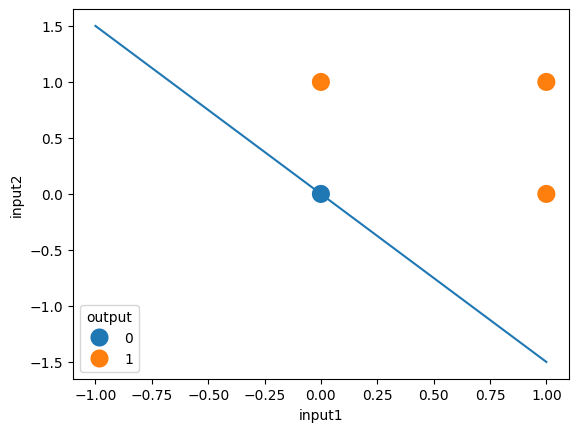

In [212]:
plt.plot(x1,y1)
sns.scatterplot(x='input1', y='input2', hue='output', data=or_data, s=200)

In [213]:
clf3.coef_

array([[0., 0.]])

In [214]:
clf3.intercept_

array([0.])

<Axes: >

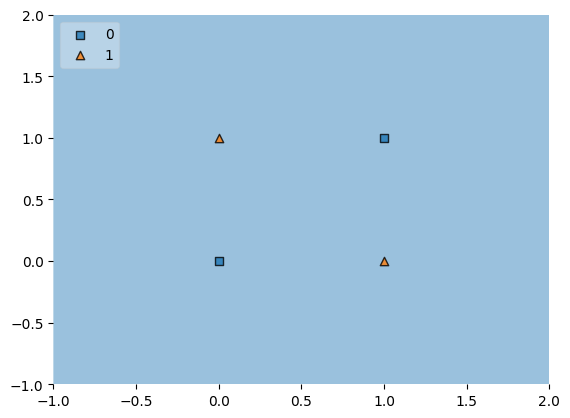

In [215]:
plot_decision_regions(xor_data.iloc[:,0:2].values,xor_data.iloc[:,-1].values,clf= clf3,legend=2)